In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull

import seir_discrete
import switch

%load_ext autoreload
%autoreload 2

In [56]:
folder = 'sampled_200k_res'
# recalc beta!
for i in range(30):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv', 
                sep='\t')
    df_b.beta_H1N1 = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
    #df_b.to_csv(f'{folder}_recalc/seirb_seed_{i}.csv', index=False)

In [5]:
sigma=1/2
gamma=1/6

In [2]:
folder = 'sampled_200k_res_recalc'

6 25.0


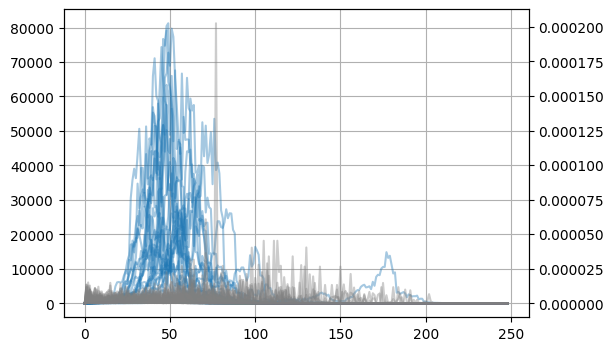

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(30):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
    else:
        
        fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
        ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)

        beta = df_b.beta_H1N1[:fin]
        
        ax_beta.plot(beta, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

In [105]:
def cpoint_perc_people(seed_df, perc=0.01, popul=200000):
    the_day = seed_df[seed_df.I_H1N1 >= popul*perc].index
    if the_day.shape[0]:
        return the_day[0]
    else:
        return -1

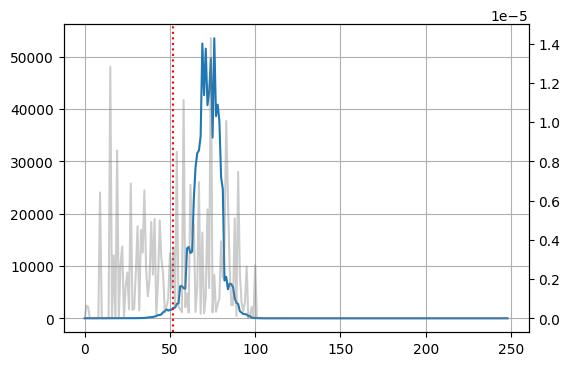

In [86]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
seed_df = df_b.copy()


ax.plot(seed_df.I_H1N1)
ax_beta.plot(seed_df.beta_H1N1, color='gray', alpha=0.4)
ax.axvline(cpoint_perc_people(seed_df, perc=0.01), ls=':', color='red')
ax.grid()

## plots for 1, 5, 10% for beta from switch, beta from 0

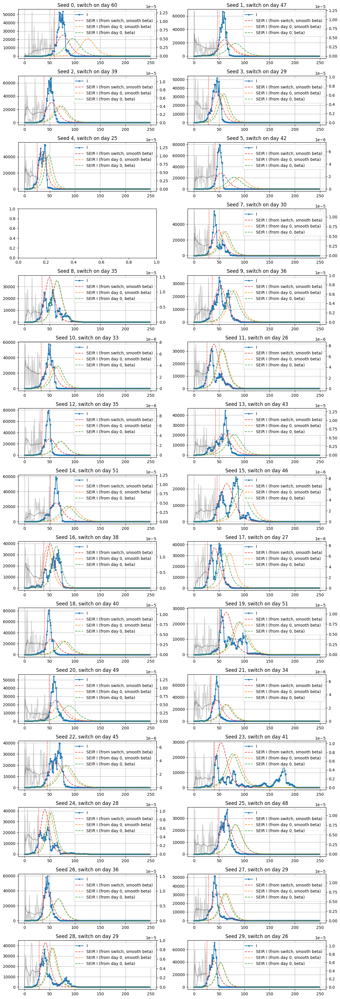

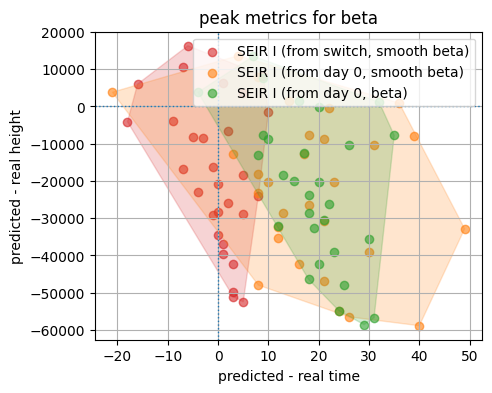

In [153]:
res = switch.plot_hybrid_3(switch_method='frac_people', perc=0.05)

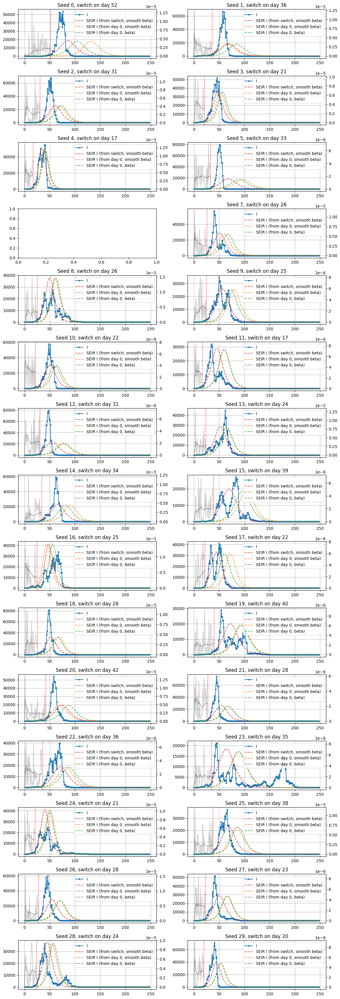

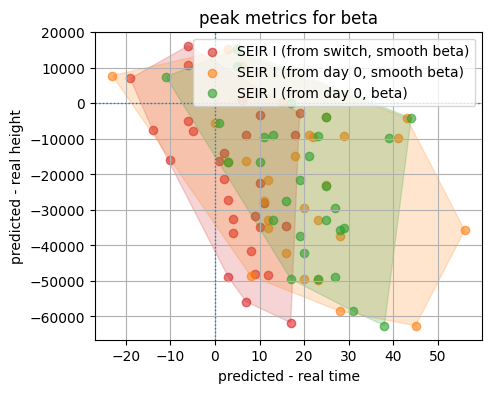

In [154]:
res1 = switch.plot_hybrid_3(switch_method='frac_people', perc=0.01)

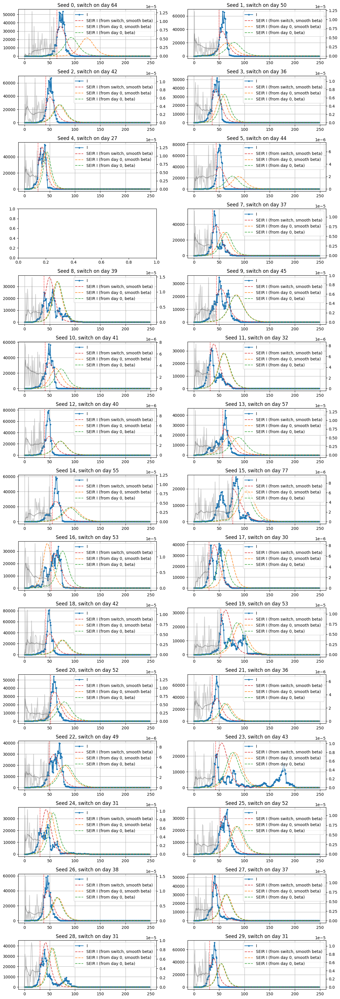

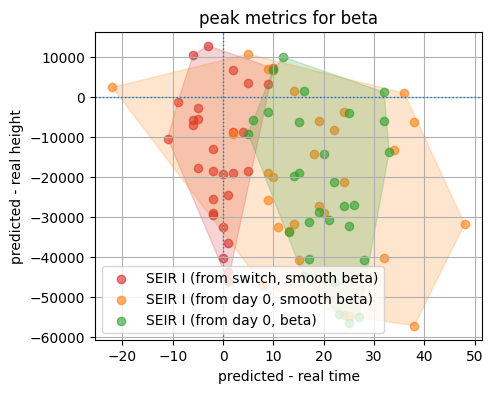

In [155]:
res10 = switch.plot_hybrid_3(switch_method='frac_people', perc=0.1,
                          beta_type='expanding')

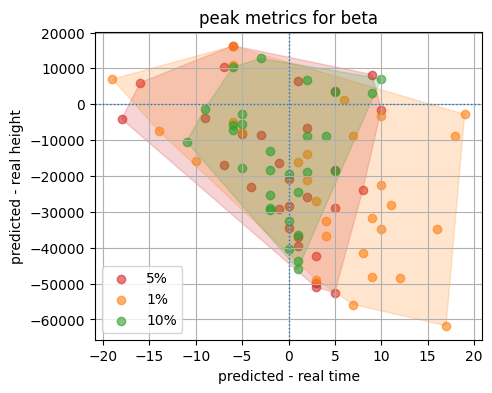

In [156]:
switch.plot_peaks_area(pts=[i[0][0] for i in [res,res1,res10]], 
                       phs=[i[1][0] for i in [res,res1,res10]],
                       labels=['5%', '1%', '10%'])

## plots for 1, 5, 10% for 3 beta types

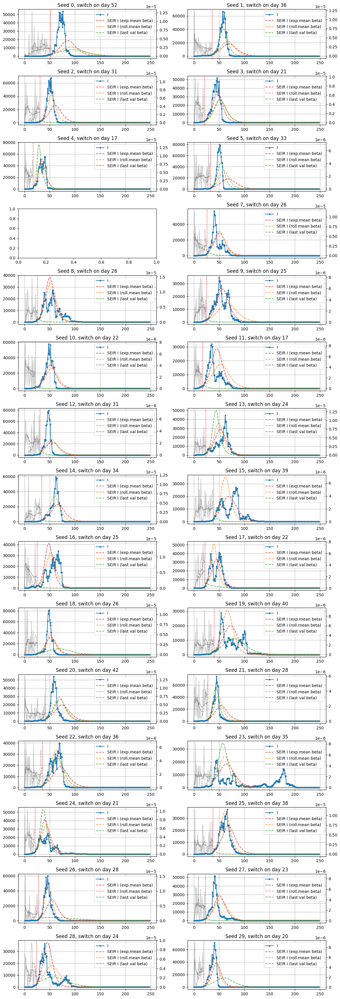

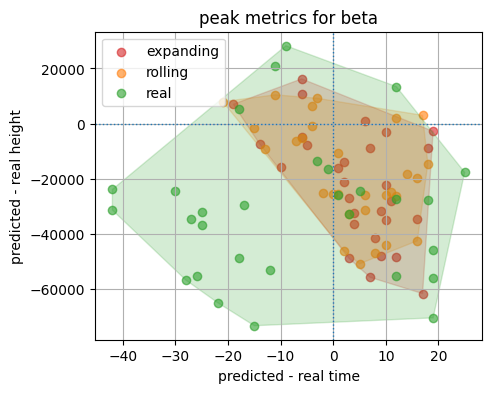

In [190]:
res_types_1 = switch.plot_hybrid(switch_method='frac_people', perc=0.01,
                                  plot_traj=True)

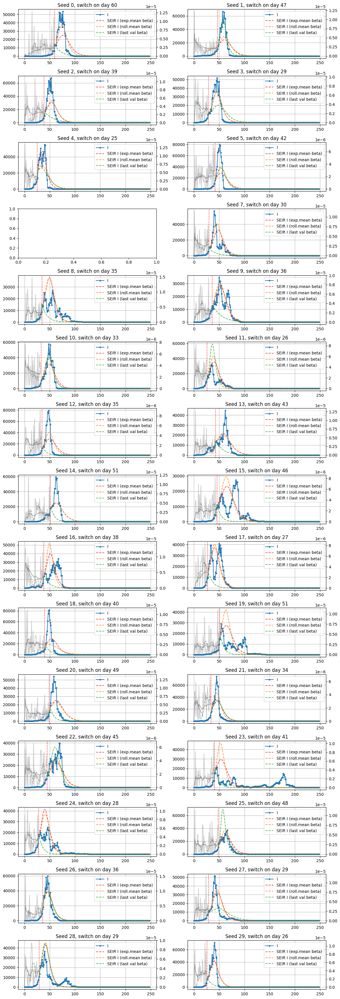

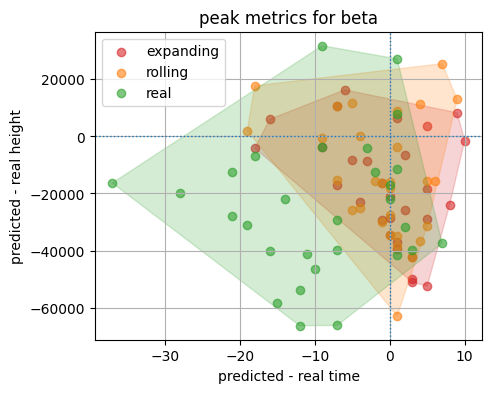

In [192]:
res_types_5 = switch.plot_hybrid(switch_method='frac_people', perc=0.05,
                                  plot_traj=True)

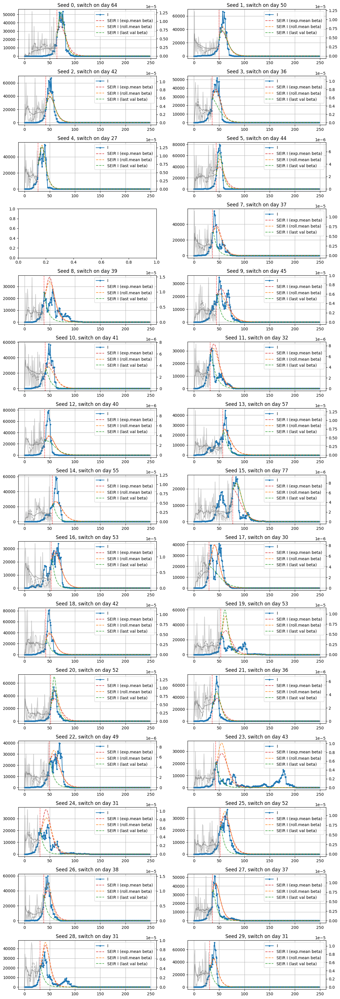

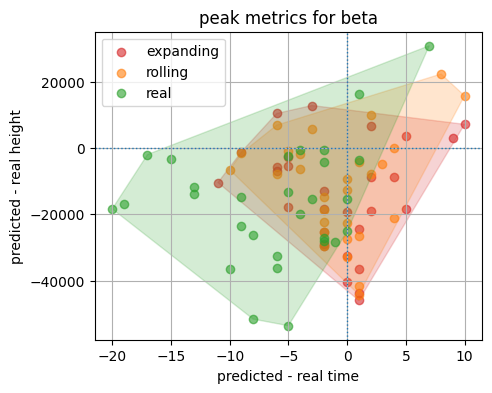

In [194]:
res_types_10 = switch.plot_hybrid(switch_method='frac_people', perc=0.1,
                                  plot_traj=True)

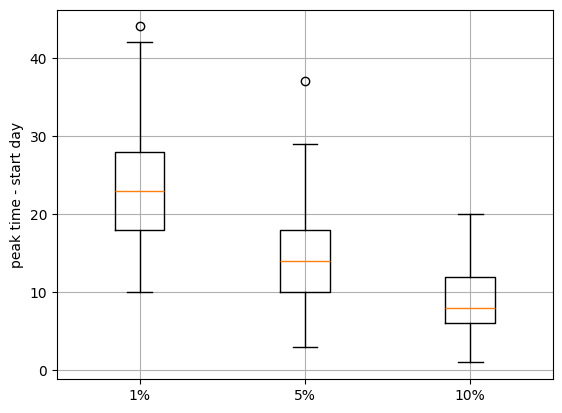

In [195]:
boxes = [np.array(res_df[3]) - np.array(res_df[2]) for res_df in 
                                                     [res_types_1, 
                                                      res_types_5, 
                                                      res_types_10]]
plt.boxplot(boxes)
plt.xticks(np.arange(1,4), ['1%', '5%', '10%'])
plt.ylabel('peak time - start day')
plt.grid();

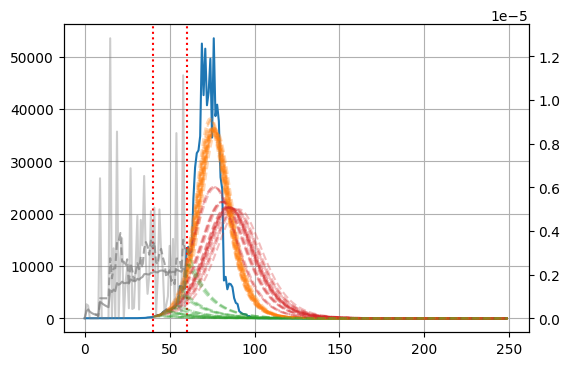

In [394]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = 250
first = 40
last = 60
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:last]
beta_exp = betas[:last].expanding().mean()
beta_roll = betas[:last].rolling(7).mean()

ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(first, ls=':', color='red')
ax.axvline(last, ls=':', color='red')

for st_day in range(first,last+1):
    y0 = df_b.iloc[st_day,:4].values
    ts = np.arange(fin-st_day)
    for beta_val, pt_l, ph_l, col, lab in zip([beta_exp.values[-1], 
                                                 beta_roll.values[-1],
                                                 betas.values[-1]],
                                               [pt_1,pt_2,pt_3], [ph_1,ph_2,ph_3],
                                               ['tab:red','tab:orange','tab:green'],
                                               ['SEIR I (exp.mean beta)',
                                                'SEIR I (roll.mean beta)',
                                                'SEIR I (last val beta)']):
        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_val, 
                                           sigma, gamma, stype='d', 
                                           beta_t=False).T

        ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.3, label=lab)
                    
                    
ax.grid()

In [202]:
df_b.I_H1N1.argmax()

76

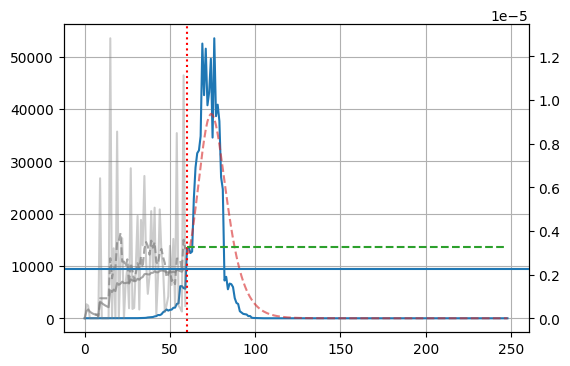

In [19]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = df_b.shape[0]
st_day = 60
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:st_day]
beta_exp = betas[:st_day].expanding().mean()
beta_roll = betas[:st_day].rolling(7).mean()

ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

beta_input = [beta_val+(1e-6)*i for i in range(fin-st_day)]
ax_beta.axhline(beta_val)
beta_input = [beta_val+1e-6 for i in range(fin-st_day)]
ax_beta.plot(np.arange(st_day,fin), beta_input, 
             ls='--', color='tab:green')
S,E,I,R = seir_discrete.seir_model(y0, ts, beta_input, 
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T

ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.6, label=lab)
                    
                 
ax.grid()

In [55]:
from sklearn.metrics import root_mean_squared_error as rmse

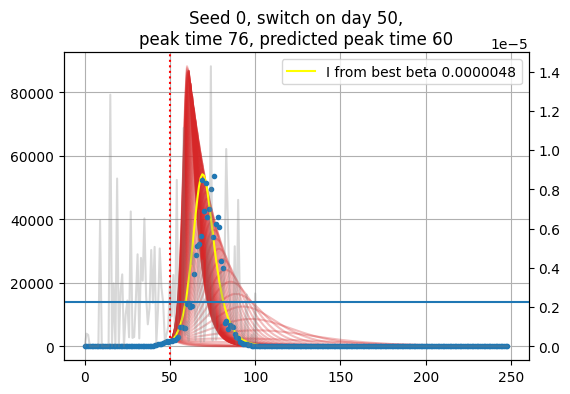

In [101]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')

fin = df_b.shape[0]
st_day = 50


betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')
ax.axvline(st_day, ls=':', color='red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.axhline(beta_val)
res_dict = dict()


real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
for b in np.arange(0.0, betas.max(), 2e-7):

    ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T

    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()
     
    rmse_pt = rmse([real_peakt], [predicted_peakt])
    rmse_ph = rmse([real_peakh], [predicted_peakh])
    res_dict[b] = [rmse_pt,rmse_ph]

    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1).values[0,0]    
S,E,I,R = seir_discrete.seir_model(y0, ts, best_b, sigma, gamma, stype='d', 
                                   beta_t=False).T

ax.plot(ts+st_day, I, color='yellow', ls='-', alpha=1, 
        label=f'I from best beta {best_b:.7f}')   

ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='')
ax.set_title(f'Seed {i}, switch on day {st_day},\n'+\
             f'peak time {real_peakt}, predicted peak time {predicted_peakt}')
ax.legend()
ax.grid()

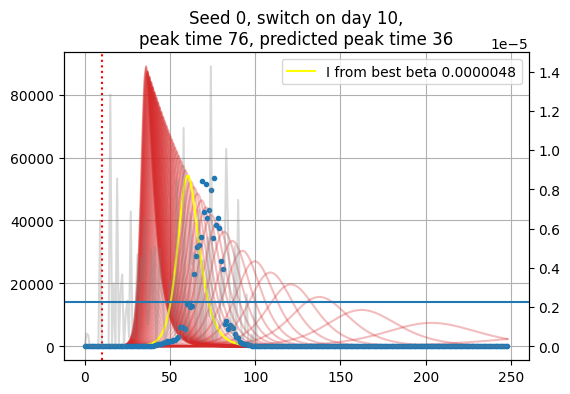

In [103]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')

fin = df_b.shape[0]
st_day = 10


betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')
ax.axvline(st_day, ls=':', color='red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.axhline(beta_val)
res_dict = dict()


real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
for b in np.arange(0.0, betas.max(), 2e-7):

    ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T

    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()
     
    rmse_pt = rmse([real_peakt], [predicted_peakt])
    rmse_ph = rmse([real_peakh], [predicted_peakh])
    res_dict[b] = [rmse_pt,rmse_ph]

    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1).values[0,0]    
S,E,I,R = seir_discrete.seir_model(y0, ts, best_b, sigma, gamma, stype='d', 
                                   beta_t=False).T

ax.plot(ts+st_day, I, color='yellow', ls='-', alpha=1, 
        label=f'I from best beta {best_b:.7f}')   

ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='')
ax.set_title(f'Seed {i}, switch on day {st_day},\n'+\
             f'peak time {real_peakt}, predicted peak time {predicted_peakt}')
ax.legend()
ax.grid()

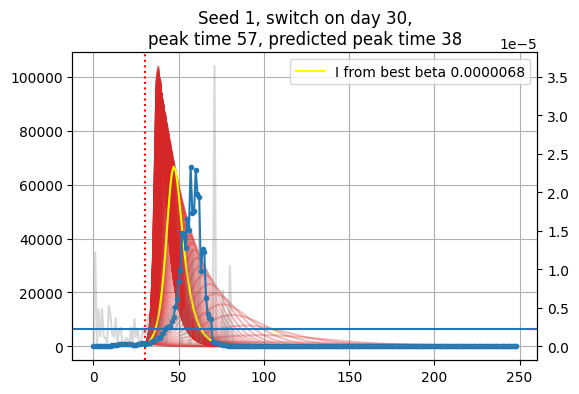

In [110]:
i=1

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')

fin = df_b.shape[0]
st_day = 30


betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')
ax.axvline(st_day, ls=':', color='red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.axhline(beta_val)
res_dict = dict()


real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
for b in np.arange(0.0, betas.max(), 2e-7):

    ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T

    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()
     
    rmse_pt = rmse([real_peakt], [predicted_peakt])
    rmse_ph = rmse([real_peakh], [predicted_peakh])
    res_dict[b] = [rmse_pt,rmse_ph]

    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1).values[0,0]    
S,E,I,R = seir_discrete.seir_model(y0, ts, best_b, sigma, gamma, stype='d', 
                                   beta_t=False).T

ax.plot(ts+st_day, I, color='yellow', ls='-', alpha=1, 
        label=f'I from best beta {best_b:.7f}')   

ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='-')
ax.set_title(f'Seed {i}, switch on day {st_day},\n'+\
             f'peak time {real_peakt}, predicted peak time {predicted_peakt}')
ax.legend()
ax.grid()

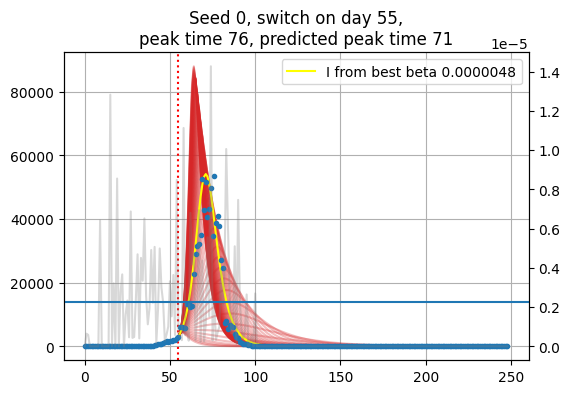

In [99]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')

fin = df_b.shape[0]
st_day = 55


betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')
ax.axvline(st_day, ls=':', color='red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.axhline(beta_val)
res_dict = dict()


real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
for b in np.arange(0.0, betas.max(), 2e-7):

    ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T

    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()
     
    rmse_pt = rmse([real_peakt], [predicted_peakt])
    rmse_ph = rmse([real_peakh], [predicted_peakh])
    res_dict[b] = [rmse_pt,rmse_ph]

    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1).values[0,0]    
S,E,I,R = seir_discrete.seir_model(y0, ts, best_b, sigma, gamma, stype='d', 
                                   beta_t=False).T
predicted_peakt = I.argmax()+st_day
predicted_peakh = I.max()
ax.plot(ts+st_day, I, color='yellow', ls='-', alpha=1, 
        label=f'I from best beta {best_b:.7f}')   

ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='')     
ax.set_title(f'Seed {i}, switch on day {st_day},\n'+\
             f'peak time {real_peakt}, predicted peak time {predicted_peakt}')
ax.legend()
ax.grid()

In [72]:
pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1)

,index,0,1
24,0.000005,7.0,687.017548
23,0.000005,6.0,1080.850199
25,0.000005,7.0,2310.211283
22,0.000004,6.0,3005.972315
26,0.000005,8.0,3927.400116


In [75]:
pd.DataFrame.from_dict(res_dict).T.reset_index().nsmallest(5,1).values[0,0]

4.8e-06

In [28]:
np.arange(0.0, betas.max(), 1e-7).shape

(143,)

In [24]:
betas.max()

1.4269055494231875e-05

## trying Chowell's uncertainty 

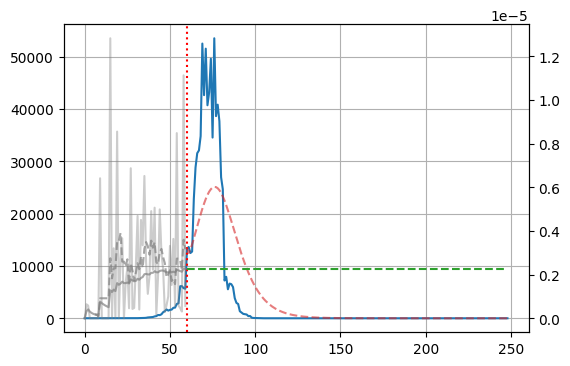

In [398]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = df_b.shape[0]
st_day = 60
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:st_day]
beta_exp = betas[:st_day].expanding().mean()
beta_roll = betas[:st_day].rolling(7).mean()

ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.plot(np.arange(st_day,fin), [beta_val for i in range(fin-st_day)], 
             ls='--', color='tab:green')
S,E,I,R = seir_discrete.seir_model(y0, ts, beta_val, 
                                   sigma, gamma, stype='d', 
                                   beta_t=False).T

ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.6, label=lab)
                    
                 
ax.grid()

In [234]:
cum_curve = pd.Series(I).expanding().sum().reset_index(drop=True)
cum_curve

0       13363.000000
1       25856.833333
2       38979.184038
3       53112.346530
4       68369.576277
           ...      
184    767723.381946
185    767723.383188
186    767723.384303
187    767723.385305
188    767723.386206
Length: 189, dtype: float64

In [286]:
pd.Series(I).mean(), pd.Series(I).var()

(4062.028498444404, 57412113.925969236)

In [285]:
cum_curve.mean(), cum_curve.var()

(684796.0319159906, 34641091469.896805)

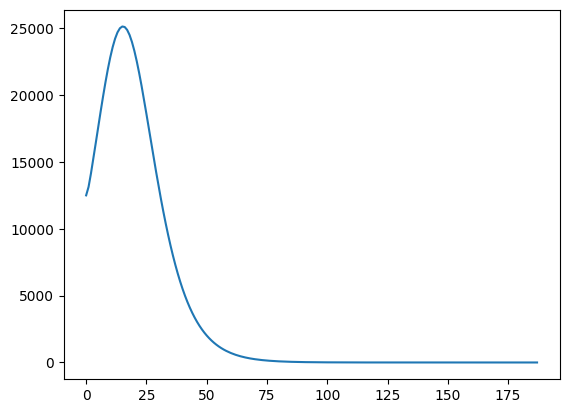

In [276]:
diffs = cum_curve[1:].values - cum_curve[:-1].values
plt.plot(diffs)

In [280]:
rng = np.random.default_rng()

all_sim_I = []
for i in range(150):
    one_sim_I = []
    for one_diff in diffs:
        lam, size = one_diff, 1
        one_sim_I.append(rng.poisson(lam=lam, size=size))
    one_sim_I = np.array(one_sim_I).flatten()
    all_sim_I.append(one_sim_I)

(0.0, 50.0)

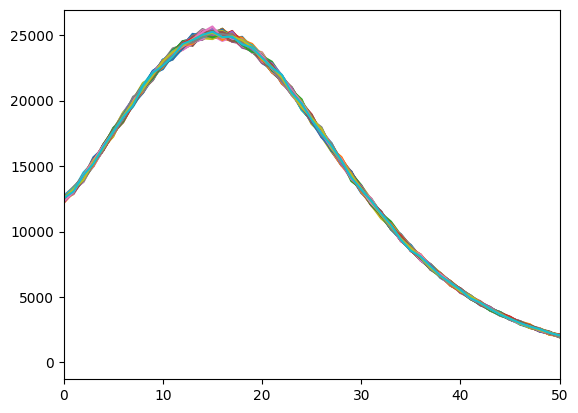

In [281]:
plt.plot(np.array(all_sim_I).T);
plt.xlim(0,50)

In [390]:
rng = np.random.default_rng()

# число неудач, произошедших до того, как набралось <n> успехов
# n successes, p probability of success
rng.negative_binomial(15000, 0.1, 10)

array([133452, 133583, 134195, 135903, 134294, 134855, 134117, 134372,
       134685, 134372], dtype=int64)

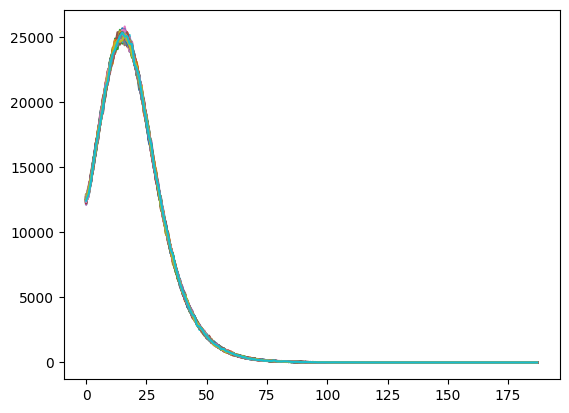

In [391]:
rng = np.random.default_rng()
all_sim_I = []
for i in range(150):
    one_sim_I = []
    for one_diff in diffs:
        one_sim_I.append(rng.negative_binomial(n=one_diff, p=0.5))
    one_sim_I = np.array(one_sim_I).flatten()
    all_sim_I.append(one_sim_I)

plt.plot(np.array(all_sim_I).T);
#plt.xlim(0,50)